# Airline Passenger Satisfaction

Customer satisfaction scores from 120,000+ airline passengers, including additional information about each passenger, their flight, and type of travel, as well as ther evaluation of different factors like cleanliness, comfort, service, and overall experience.

### Recommended Analysis

Objective: Which factors contribute to customer satisfaction the most? What about dissatisfaction?  


### Data Dictionary

* ID:	Unique passenger identifier

* Gender:	Gender of the passenger (Female/Male)

* Age:	Age of the passenger

* Customer Type:	Type of airline customer (First-time/Returning)

* Type of Travel:	Purpose of the flight (Business/Personal)

* Class:	Travel class in the airplane for the passenger seat

* Flight Distance:	Flight distance in miles

* Departure Delay:	Flight departure delay in minutes

* Arrival Delay:	Flight arrival delay in minutes

* Departure and Arrival Time Convenience:	Satisfaction level with the convenience of the flight departure and arrival times from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Ease of Online Booking:	Satisfaction level with the online booking experience from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Check-in Service:	Satisfaction level with the check-in service from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Online Boarding:	Satisfaction level with the online boarding experience from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Gate Location:	Satisfaction level with the gate location in the airport from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* On-board Service:	Satisfaction level with the on-boarding service in the airport from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Seat Comfort:	Satisfaction level with the comfort of the airplane seat from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Leg Room Service:	Satisfaction level with the leg room of the airplane seat from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Cleanliness:	Satisfaction level with the cleanliness of the airplane from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Food and Drink:	Satisfaction level with the food and drinks on the airplane from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* In-flight Service:	Satisfaction level with the in-flight service from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* In-flight Wifi Service:	Satisfaction level with the in-flight Wifi service from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* In-flight Entertainment:	Satisfaction level with the in-flight entertainment from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Baggage Handling:	Satisfaction level with the baggage handling from the airline from 1 (lowest) to 5 (highest) - 0 means "not applicable"

* Satisfaction:	Overall satisfaction level with the airline (Satisfied/Neutral or unsatisfied)

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# To build model for logistic prediction

from sklearn.linear_model import LogisticRegression

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# Libraries to build decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To tune different models
from sklearn.model_selection import GridSearchCV

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    plot_confusion_matrix,
    make_scorer,
    roc_auc_score,
    plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
)

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Command to tell Python to actually display the graphs
%matplotlib inline

# open-source Python graphing library for building beautiful, interactive visualizations, and showing exact numbers
!pip install plotly
import plotly.express as px

from sklearn.preprocessing import StandardScaler, MinMaxScaler

ImportError: cannot import name 'plot_confusion_matrix' from 'sklearn.metrics' (E:\New folder\lib\site-packages\sklearn\metrics\__init__.py)

### Read the dataset

In [2]:

df= pd.read_csv("Airline_passenger_satisfaction.csv")

In [3]:
df.head()

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,3,4,3,3,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,2,3,5,2,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,4,4,5,4,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,2,3,4,2,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,3,3,5,3,3,4,4,5,4,3,3,3,3,Satisfied


In [4]:
df.tail()

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,4,4,4,2,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,3,5,3,4,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,2,4,2,1,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,4,3,4,1,4,4,5,3,3,4,5,3,5,Satisfied
129879,129880,Female,20,Returning,Personal,Economy Plus,337,0,0.0,1,3,4,3,2,4,2,4,2,2,2,3,2,1,Neutral or Dissatisfied


In [6]:
# drop the last row
df = df.drop(df.index[-1])
df.tail()

#drop ID
df.drop(['ID'], axis=1, inplace=True)

In [7]:
np.random.seed(1)
df.sample(n=10)

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
57690,Male,27,First-time,Business,Business,867,0,0.0,4,4,4,4,5,3,5,5,5,5,5,4,5,4,Satisfied
3616,Female,28,Returning,Business,Business,3161,0,0.0,3,3,5,4,3,3,3,2,3,3,4,3,3,5,Satisfied
85759,Female,26,First-time,Business,Business,526,0,0.0,0,0,5,0,2,3,2,2,2,2,5,0,2,5,Satisfied
63446,Male,45,Returning,Personal,Economy,337,41,29.0,4,3,1,3,4,3,4,4,4,4,4,3,4,4,Neutral or Dissatisfied
125892,Male,42,Returning,Personal,Economy,920,0,10,4,4,3,4,4,1,4,2,4,4,4,4,4,4,Neutral or Dissatisfied
134280,Male,14,Returning,Personal,Business,240,0,0.0,3,3,3,3,2,4,1,3,2,2,3,3,2,4,Neutral or Dissatisfied
177344,Male,12,Returning,Business,Business,1999,0,0.0,5,5,4,2,5,1,2,2,2,2,3,2,2,4,Neutral or Dissatisfied
18741,Female,42,Returning,Business,Business,2113,11,0.0,2,2,4,5,2,5,2,5,5,1,5,2,5,5,Satisfied
38021,Male,30,Returning,Business,Business,2396,0,0.0,4,4,4,4,4,4,4,1,4,4,4,4,4,5,Satisfied
105357,Female,50,Returning,Personal,Economy,528,12,7,4,1,2,5,3,2,4,1,1,4,2,3,2,2,Neutral or Dissatisfied


### Understand the shape of the dataset.

In [5]:
df.shape


(129880, 24)

### Check the data types of the columns for the dataset.


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  object 
 2   Age                                     129880 non-null  int64  
 3   Customer Type                           129880 non-null  object 
 4   Type of Travel                          129880 non-null  object 
 5   Class                                   129880 non-null  object 
 6   Flight Distance                         129880 non-null  int64  
 7   Departure Delay                         129880 non-null  int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

* Age, Flight Distance, Arrival Delay, and Departure Delay are continuous variables.

In [7]:
df["Customer Type"].unique()

array(['First-time', 'Returning'], dtype=object)

In [8]:
df["Type of Travel"].unique()

array(['Business', 'Personal'], dtype=object)

In [9]:
df["Class"].unique()

array(['Business', 'Economy', 'Economy Plus'], dtype=object)

In [10]:
#df['ID'] = pd.to_numeric(df['ID'], errors='coerce')
#df['ID'] = df['ID'].astype(float)
#df['Gender'] = pd.to_numeric(df['Gender'], errors='coerce')
# create a dictionary to map the string values to numerical values
gender_map = {"Male": 0, "Female": 1}

# apply the mapping to the "Gender" column using the map method
df["Gender"] = df["Gender"].map(gender_map)

# convert the "Gender" column to a numeric data type
df["Gender"] = df["Gender"].astype(float)

df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
# Convert the "Age" column to integer
df['Age'] = df['Age'].astype("Int64")
df['Departure Delay'] = pd.to_numeric(df['Departure Delay'], errors='coerce').astype('Int64')
df['Arrival Delay'] = pd.to_numeric(df['Arrival Delay'], errors='coerce').astype(float)
df['Flight Distance'] = pd.to_numeric(df['Flight Distance'], errors='coerce').astype('Int64')

cust_map = {"First-time": 0, "Returning": 1, "Customer Type":2}
# apply the mapping to the "Gender" column using the map method
df["Customer Type"] = df["Customer Type"].map(cust_map)
# convert the "Gender" column to a numeric data type
df["Customer Type"] = df["Customer Type"].astype(float)

business_map = {"Personal": 0, "Business": 1, "Type of Travel":2}
# apply the mapping to the "Gender" column using the map method
df["Type of Travel"] = df["Type of Travel"].map(business_map)
# convert the "Gender" column to a numeric data type
df["Type of Travel"] = df["Type of Travel"].astype(float)

class_map = {"Economy": 0, "Economy Plus": 1, "Business":2, "Class":3}
# apply the mapping to the "Gender" column using the map method
df["Class"] = df["Class"].map(class_map)
# convert the "Gender" column to a numeric data type
df["Class"] = df["Class"].astype(float)
#df["Departure and Arrival Time Convenience"] = df["Departure and Arrival Time Convenience"].astype(float)
#df["Check-in Service"] = df["Check-in Service"].astype(float)
#df["Online Boarding"] = df["Online Boarding"].astype(float)
#df["Gate Location"] = df["Gate Location"].astype(float)
#df["On-board Service"] = df["On-board Service"].astype(float)
#df["Seat Comfort"] = df["Seat Comfort"].astype(float)
#df["Leg Room Service"] = df["Leg Room Service"].astype(float)
#df["Cleanliness"] = df["Cleanliness"].astype(float)
#df["Food and Drink"] = df["Food and Drink"].astype(float)
#df["In-flight Service"] = df["In-flight Service"].astype(float)
#df["In-flight Wifi Service"] = df["In-flight Wifi Service"].astype(float)
#df["In-flight Entertainment"] = df["In-flight Entertainment"].astype(float)
#df["Baggage Handling"] = df["Baggage Handling"].astype(float)
#df["Ease of Online Booking"] = df["Ease of Online Booking"].astype(float)
# create a dictionary to map the string values to numerical values
sat_map = {"Satisfied": 0, "Neutral or Dissatisfied": 1}

# apply the mapping to the "Gender" column using the map method
df["Satisfaction"] = df["Satisfaction"].map(sat_map)
df["Satisfaction"] = df["Satisfaction"].astype(float)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  float64
 2   Age                                     129880 non-null  Int64  
 3   Customer Type                           129880 non-null  float64
 4   Type of Travel                          129880 non-null  float64
 5   Class                                   129880 non-null  float64
 6   Flight Distance                         129880 non-null  Int64  
 7   Departure Delay                         129880 non-null  Int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

In [11]:
np.random.seed(1)
df.sample(n=10)

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
24303,24304,0.0,25,0.0,1.0,1.0,302,0,0.0,0,2,5,2,5,1,4,4,4,4,3,2,4,3,1.0
59503,59504,1.0,8,1.0,0.0,1.0,758,38,32.0,5,3,3,3,2,5,4,2,4,4,4,2,4,4,1.0
63836,63837,1.0,28,1.0,1.0,2.0,2647,0,2.0,5,5,4,4,5,4,4,5,4,4,4,5,4,4,0.0
2451,2452,0.0,50,1.0,1.0,2.0,674,15,52.0,1,1,2,4,1,2,3,2,4,3,2,2,2,2,1.0
124012,124013,0.0,22,0.0,1.0,0.0,184,0,0.0,0,1,3,1,3,1,2,5,2,2,1,1,2,3,1.0
80207,80208,0.0,34,1.0,0.0,1.0,2586,202,NaN,3,3,1,1,4,5,1,4,1,3,3,3,4,2,1.0
84779,84780,1.0,23,0.0,1.0,2.0,547,0,0.0,3,5,5,5,1,3,3,3,4,4,4,5,4,5,0.0
16537,16538,1.0,39,1.0,1.0,2.0,2202,0,0.0,1,1,4,5,1,4,4,4,5,4,4,1,4,4,0.0
123038,123039,0.0,53,1.0,1.0,2.0,2620,0,6.0,1,1,4,4,1,1,4,1,1,1,1,1,1,1,1.0
118534,118535,1.0,52,1.0,1.0,2.0,338,12,23.0,0,0,5,5,4,5,5,5,3,2,5,0,5,5,0.0


### Summary of the dataset

In [15]:
df.describe(include="all")

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
count,203332.000000,203332.000000,203333.000000,203333.000000,203333.000000,203332.000000,203332.000000,202712.000000,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203333.0,203332.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,12.0,13.0,12.0,13.0,12.0,13.0,13.0,13.0,13.0,13.0,13.0,11.0,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41557.0,41711.0,44608.0,41719.0,47900.0,44777.0,45218.0,40123.0,39661.0,36279.0,56975.0,45970.0,40595.0,56225.0,NaN
mean,0.509162,38.786044,0.794136,0.624749,0.879415,1096.176450,15.325340,15.800890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.722483
std,0.499917,15.642414,0.404345,0.484199,0.950955,936.677449,38.855654,39.232163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.447775
min,0.000000,7.000000,0.000000,0.000000,0.000000,31.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,0.000000,26.000000,1.000000,0.000000,0.000000,403.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,1.000000,39.000000,1.000000,1.000000,0.000000,763.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
75%,1.000000,51.000000,1.000000,1.000000,2.000000,1542.000000,13.000000,14.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000


#### Summary of the numerical data

In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Gender,203332.0,0.509162,0.499917,0.0,0.0,1.0,1.0,1.0
Age,203332.0,38.786044,15.642414,7.0,26.0,39.0,51.0,85.0
Customer Type,203333.0,0.794136,0.404345,0.0,1.0,1.0,1.0,2.0
Type of Travel,203333.0,0.624749,0.484199,0.0,0.0,1.0,1.0,2.0
Class,203333.0,0.879415,0.950955,0.0,0.0,0.0,2.0,3.0
Flight Distance,203332.0,1096.176450,936.677449,31.0,403.0,763.0,1542.0,4983.0
Departure Delay,203332.0,15.325340,38.855654,0.0,0.0,0.0,13.0,1592.0
Arrival Delay,202712.0,15.800890,39.232163,0.0,0.0,0.0,14.0,1584.0
Satisfaction,203332.0,0.722483,0.447775,0.0,0.0,1.0,1.0,1.0


In [12]:
df.describe()

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
count,129880.000000,129880.000000,129880.0,129880.000000,129880.000000,129880.000000,129880.0,129880.0,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,64940.500000,0.507384,39.427957,0.816908,0.690584,1.029650,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114,0.565537
std,37493.270818,0.499947,15.11936,0.386743,0.462255,0.962636,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025,0.495688
min,1.000000,0.000000,7.0,0.000000,0.000000,0.000000,31.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,32470.750000,0.000000,27.0,1.000000,0.000000,0.000000,414.0,0.0,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000,0.000000
50%,64940.500000,1.000000,40.0,1.000000,1.000000,1.000000,844.0,0.0,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000,1.000000
75%,97410.250000,1.000000,51.0,1.000000,1.000000,2.000000,1744.0,12.0,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000,1.000000
max,129880.000000,1.000000,85.0,1.000000,1.000000,2.000000,4983.0,1592.0,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.000000


### Check for missing values

In [13]:
df.isnull().sum()

ID                                          0
Gender                                      0
Age                                         0
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             0
Departure Delay                             0
Arrival Delay                             393
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Service                      0
In-flight Entertainment           

In [14]:
df["Arrival Delay"] = df["Arrival Delay"].astype(object)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  float64
 2   Age                                     129880 non-null  Int64  
 3   Customer Type                           129880 non-null  float64
 4   Type of Travel                          129880 non-null  float64
 5   Class                                   129880 non-null  float64
 6   Flight Distance                         129880 non-null  Int64  
 7   Departure Delay                         129880 non-null  Int64  
 8   Arrival Delay                           129487 non-null  object 
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

In [21]:
df.isnull().sum()

Gender                                      1
Age                                         1
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             1
Departure Delay                             1
Arrival Delay                             621
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Service                      0
In-flight Entertainment                     0
Baggage Handling                  

In [22]:
df["Arrival Delay"]

0          5.0
1         39.0
2          0.0
3          0.0
4          1.0
          ... 
203328    11.0
203329    29.0
203330     0.0
203331     0.0
203332     0.0
Name: Arrival Delay, Length: 203333, dtype: object

* It could be that the airplane arrival was on time. I will keep the missing values.

# 1) Perform an Exploratory Data Analysis on the data

### Categorical Variables

In [15]:
# Making a list of all catrgorical variables
cat_col = [
    "Gender",
    "Customer Type",
"Type of Travel",
"Class",
"Flight Distance",
"Departure Delay",
"Arrival Delay",
"Departure and Arrival Time Convenience",
"Ease of Online Booking",
"Check-in Service",
"Online Boarding",
"Gate Location",
"On-board Service",
"Seat Comfort",
"Leg Room Service",
"Cleanliness",
"Food and Drink",
"In-flight Service",
"In-flight Wifi Service",
"In-flight Entertainment",
"Baggage Handling",
"Satisfaction",
]

# Printing number of count of each unique value in each column
for column in cat_col:
    print(df[column].value_counts())
    print("-" * 40)

1.0    65899
0.0    63981
Name: Gender, dtype: int64
----------------------------------------
1.0    106100
0.0     23780
Name: Customer Type, dtype: int64
----------------------------------------
1.0    89693
0.0    40187
Name: Type of Travel, dtype: int64
----------------------------------------
2.0    62160
0.0    58309
1.0     9411
Name: Class, dtype: int64
----------------------------------------
337     841
594     505
404     480
862     473
2475    470
       ... 
1492      1
815       1
1293      1
1196      1
1051      1
Name: Flight Distance, Length: 3821, dtype: Int64
----------------------------------------
0      73356
1       3682
2       2855
3       2535
4       2309
       ...  
566        1
501        1
460        1
455        1
359        1
Name: Departure Delay, Length: 466, dtype: Int64
----------------------------------------
0.0       72753
1.0        2747
2.0        2587
3.0        2442
4.0        2373
          ...  
1011.0        1
386.0         1
624.0      

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

def labeled_barplot1(df, column, perc=False):
    # Convert non-numeric values to NaN
    df[column] = pd.to_numeric(df[column], errors='coerce')
    
    # Drop NaN values
    df = df.dropna(subset=[column])
    
    # Create a bar plot of the column
    counts = df[column].value_counts(normalize=perc)
    ax = counts.plot(kind='bar')
    
    # Add labels to the bars
    for i, v in enumerate(counts):
        ax.text(i, v, f'{v:.1%}' if perc else f'{v:,}', ha='center', va='bottom')
    
    # Add axis labels and title
    ax.set_xlabel(column)
    ax.set_ylabel('Count' if not perc else 'Percentage')
    ax.set_title(f'{column} Distribution')
    plt.show()


In [19]:
labeled_barplot(df, "Gender", perc=True)

NameError: name 'labeled_barplot' is not defined

* There are more women than men in this study.

In [20]:
labeled_barplot(df, "Customer Type", perc=True)

NameError: name 'labeled_barplot' is not defined

* There are more "Returning" customer type than "First-time".

In [21]:
# creating histograms
fig = px.histogram(df, x="Age")
fig.show()

* It looks normal skewed. The age range seems to be around 25-55 years old.

In [22]:
fig = px.histogram(df, x="Departure Delay", nbins=50)
fig.show()

* The average `Departure Delay` was around 0 minutes.

In [23]:
fig = px.histogram(df, x="Arrival Delay", nbins=50)
fig.show()

In [24]:
fig = px.histogram(df, x="Flight Distance")
fig.show()

* It seems right skewed. The most amount of flight distance is between 180-800 miles.

### Bivariate Analysis

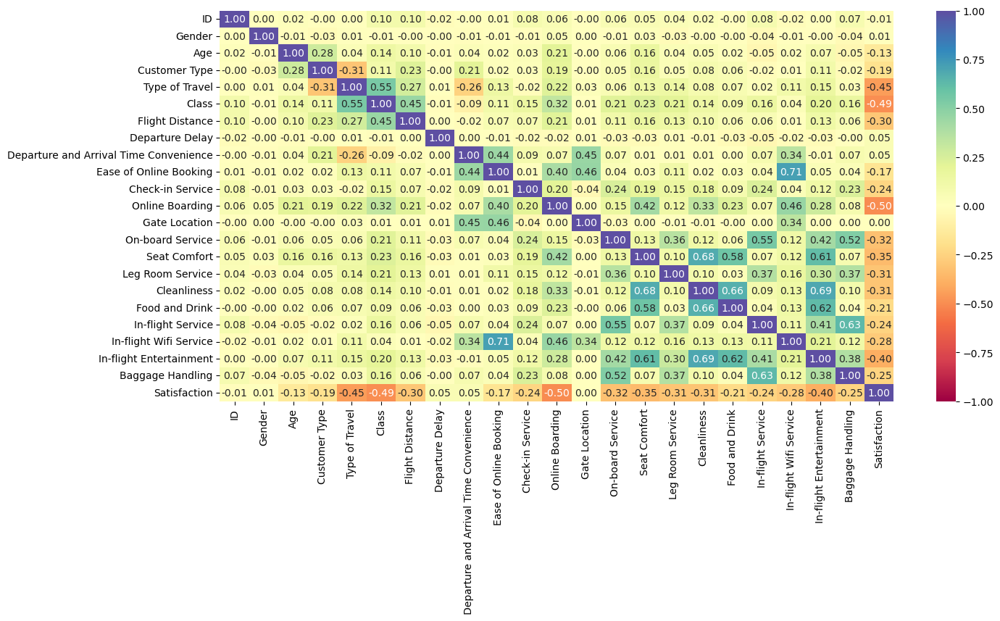

In [25]:
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

* It seems that people were not satisfied with online boarding as it is the strongest negative correlation in this analysis.

In [26]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Satisfaction    0.0    1.0     All
Gender                            
All           56428  73452  129880
1.0           28269  37630   65899
0.0           28159  35822   63981
------------------------------------------------------------------------------------------------------------------------


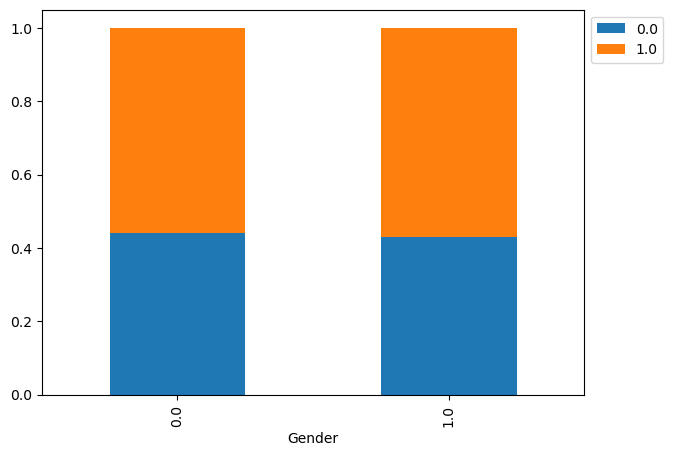

In [27]:
stacked_barplot(df, "Gender", "Satisfaction")

* 72% of both men and women are dissatisfied with the airline.
* From men alone, 72% of them were dissatisfied. From women alone, 73% of them were dissatisfied.

Satisfaction       0.0    1.0     All
Online Boarding                      
All              56428  73452  129880
4                23966  14502   38468
5                22652   3368   26020
3                 3732  23385   27117
2                 2512  19422   21934
1                 1827  11434   13261
0                 1739   1341    3080
------------------------------------------------------------------------------------------------------------------------


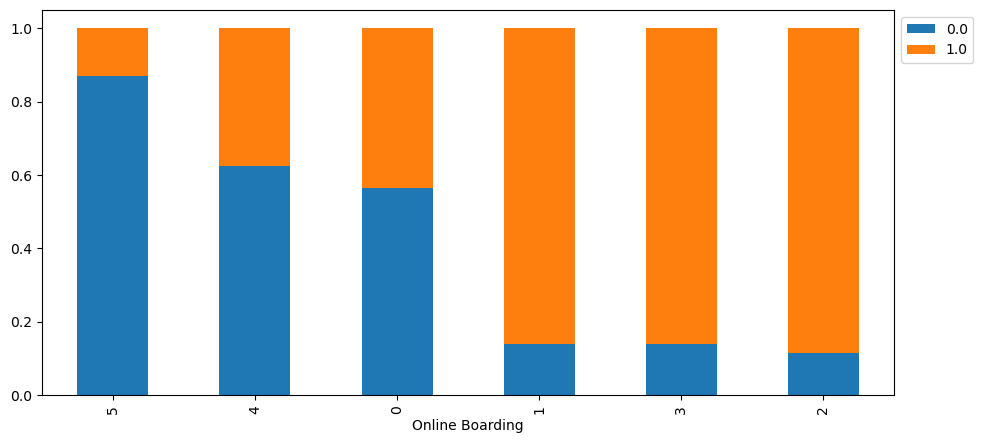

In [28]:
stacked_barplot(df, "Online Boarding", "Satisfaction")

Satisfaction      0.0     1.0     All
Type of Travel                       
All             56428  146904  203332
1.0             52356   74674  127030
0.0              4072   72230   76302
------------------------------------------------------------------------------------------------------------------------


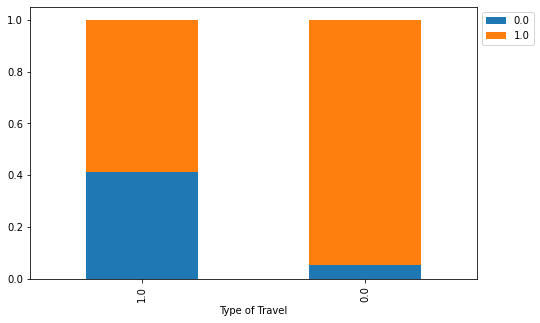

In [54]:
stacked_barplot(df, "Type of Travel", "Satisfaction")

* Personal travel (0): 94.7% were dissatified.
* Business travel (1): 58.8%  were dissatified.

Satisfaction              0.0    1.0     All
In-flight Wifi Service                      
All                     56428  73452  129880
4                       14884   9891   24775
5                       14215    141   14356
3                        8105  24080   32185
2                        7990  24330   32320
1                        7328  15000   22328
0                        3906     10    3916
------------------------------------------------------------------------------------------------------------------------


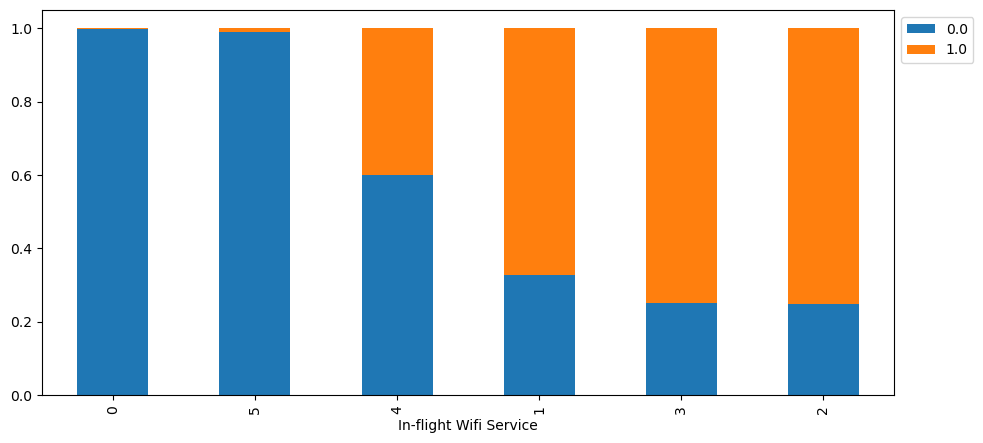

In [29]:
stacked_barplot(df, "In-flight Wifi Service", "Satisfaction")

Satisfaction         0.0    1.0     All
In-flight Service                      
All                56428  73452  129880
4                  22632  24691   47323
5                  20820  13246   34066
3                   6083  19233   25316
2                   4305  10003   14308
1                   2588   6274    8862
0                      0      5       5
------------------------------------------------------------------------------------------------------------------------


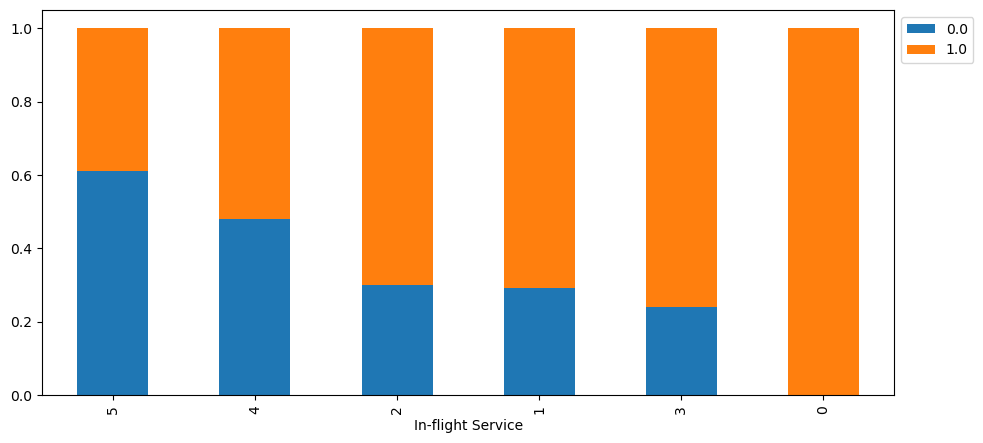

In [30]:
stacked_barplot(df, "In-flight Service", "Satisfaction")

* This does not seem right as there should be more satisfaction percentage with the 4 and 5 ratings. 